In [1]:
import keras
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
%matplotlib inline

img = cv2.imread('../data/board_photos/set1/baseline_board.jpg',0)

Using TensorFlow backend.


In [2]:
!pip install opencv-python

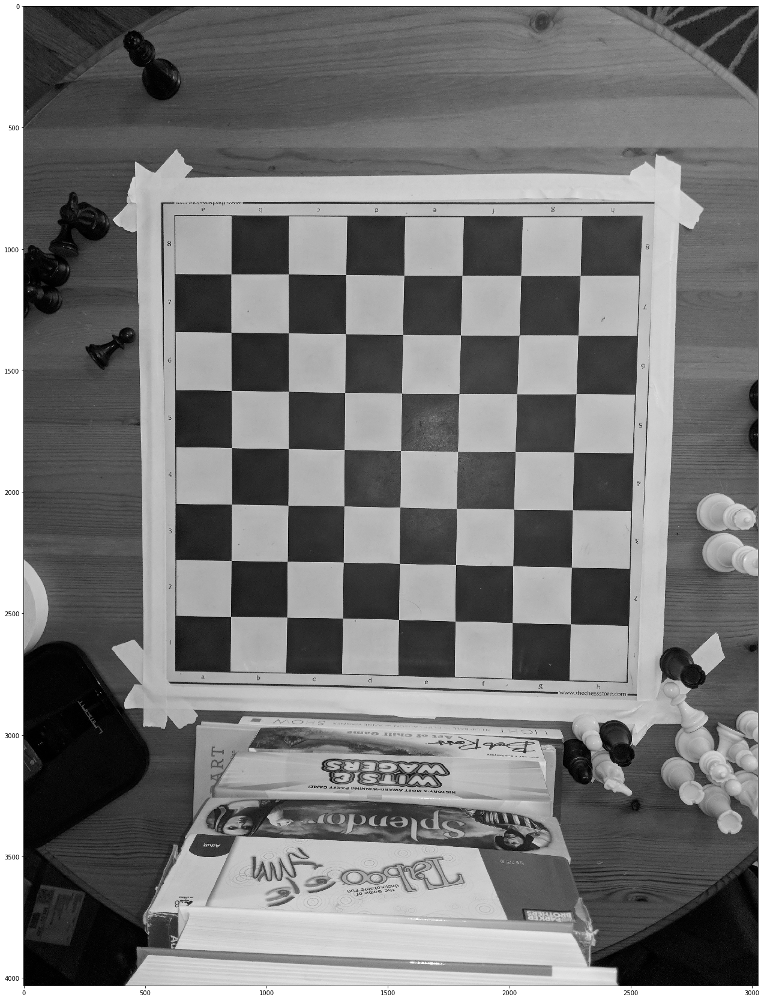

In [3]:

plt.figure(figsize=(30,30))
plt.imshow(img, cmap='gray')

In [4]:
ret, corners = cv2.findChessboardCorners(img,(7,7), flags=cv2.CALIB_CB_NORMALIZE_IMAGE|cv2.CALIB_CB_ADAPTIVE_THRESH)
corners = corners.reshape((49,2))
corners2 = corners.reshape((7,7,2))

In [5]:
print(ret)
print(corners2)

True
[[[ 855.97205 1104.008  ]
  [1091.8401  1104.5725 ]
  [1328.9688  1106.9238 ]
  [1567.4886  1108.9384 ]
  [1806.683   1110.8611 ]
  [2049.2864  1110.7632 ]
  [2293.1323  1110.9957 ]]

 [[ 856.47504 1344.6965 ]
  [1091.0889  1347.4846 ]
  [1326.556   1350.7859 ]
  [1562.7834  1353.4037 ]
  [1801.0819  1355.2417 ]
  [2041.2285  1355.3013 ]
  [2284.7144  1355.3379 ]]

 [[ 856.9233  1584.0392 ]
  [1091.2682  1587.4518 ]
  [1324.9231  1590.9576 ]
  [1558.823   1595.1222 ]
  [1793.9835  1597.0787 ]
  [2033.5663  1598.2245 ]
  [2275.8699  1597.8834 ]]

 [[ 857.8376  1819.241  ]
  [1091.0411  1823.0673 ]
  [1322.9258  1827.014  ]
  [1554.8068  1831.2455 ]
  [1788.5857  1834.3579 ]
  [2025.8243  1836.2661 ]
  [2268.0288  1838.0848 ]]

 [[ 858.0558  2052.4304 ]
  [1090.1951  2055.9583 ]
  [1320.9772  2059.098  ]
  [1551.8494  2064.3071 ]
  [1784.0701  2068.5552 ]
  [2020.325   2072.136  ]
  [2260.8982  2075.4946 ]]

 [[ 856.7872  2283.2224 ]
  [1087.7734  2286.9065 ]
  [1318.32    2290.0713

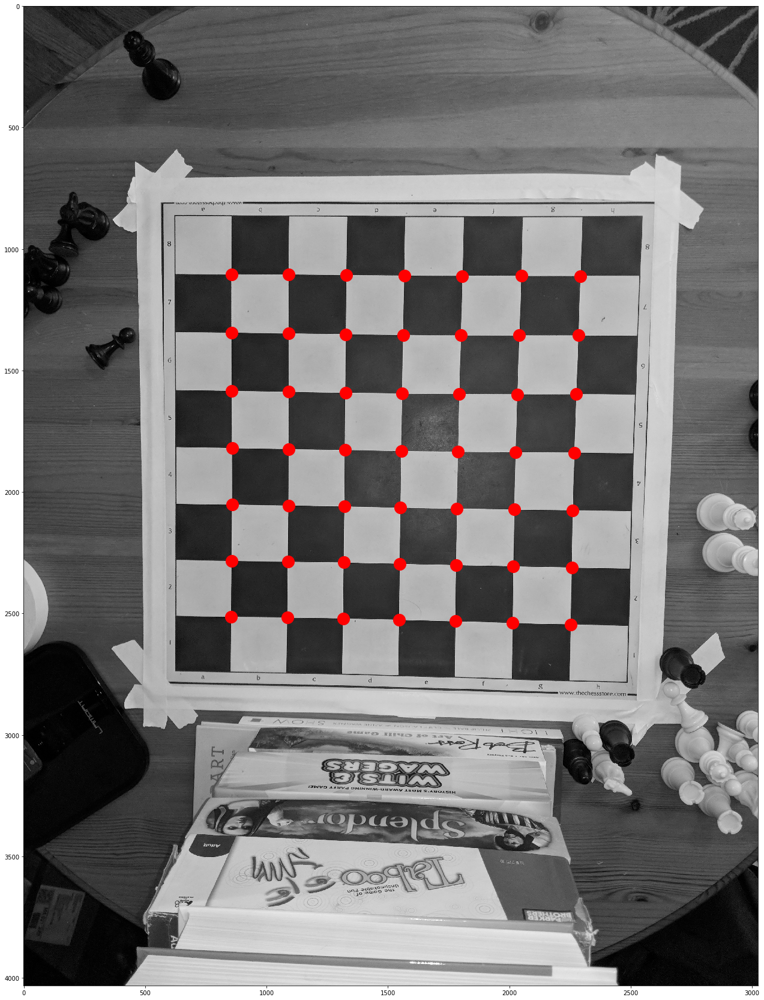

In [6]:
plt.figure(figsize=(30,30))
plt.imshow(img, cmap='gray')
for x in range(7):
    for y in range(7):
        plt.plot([corners2[x,y,0]],[corners2[x,y,1]],'o',color = 'r',markersize=20)


In [7]:
print(corners[:,0])

[ 855.97205 1091.8401  1328.9688  1567.4886  1806.683   2049.2864
 2293.1323   856.47504 1091.0889  1326.556   1562.7834  1801.0819
 2041.2285  2284.7144   856.9233  1091.2682  1324.9231  1558.823
 1793.9835  2033.5663  2275.8699   857.8376  1091.0411  1322.9258
 1554.8068  1788.5857  2025.8243  2268.0288   858.0558  1090.1951
 1320.9772  1551.8494  1784.0701  2020.325   2260.8982   856.7872
 1087.7734  1318.32    1548.6006  1781.0254  2015.892   2257.0422
  854.39417 1085.2896  1315.3809  1545.8268  1777.9656  2013.5166
 2252.031  ]


In [8]:
from itertools import product 
a = np.linspace(7,1,7)
b = np.linspace(7,1,7)
X_train = np.array(list(product(a,b)))
print(X_train)
print(X_train[1])

[[7. 7.]
 [7. 6.]
 [7. 5.]
 [7. 4.]
 [7. 3.]
 [7. 2.]
 [7. 1.]
 [6. 7.]
 [6. 6.]
 [6. 5.]
 [6. 4.]
 [6. 3.]
 [6. 2.]
 [6. 1.]
 [5. 7.]
 [5. 6.]
 [5. 5.]
 [5. 4.]
 [5. 3.]
 [5. 2.]
 [5. 1.]
 [4. 7.]
 [4. 6.]
 [4. 5.]
 [4. 4.]
 [4. 3.]
 [4. 2.]
 [4. 1.]
 [3. 7.]
 [3. 6.]
 [3. 5.]
 [3. 4.]
 [3. 3.]
 [3. 2.]
 [3. 1.]
 [2. 7.]
 [2. 6.]
 [2. 5.]
 [2. 4.]
 [2. 3.]
 [2. 2.]
 [2. 1.]
 [1. 7.]
 [1. 6.]
 [1. 5.]
 [1. 4.]
 [1. 3.]
 [1. 2.]
 [1. 1.]]
[7. 6.]


In [9]:
# Create two regression to find outer corners
from sklearn.linear_model import LinearRegression

X_Regressor = LinearRegression()
Y_Regressor = LinearRegression()


In [10]:
X_Regressor.fit(X_train,corners[:,0])
Y_Regressor.fit(X_train,corners[:,1])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [11]:
edge_features = np.array([
    (8,8),
    (8,7),
    (8,6),
    (8,5),
    (8,4),
    (8,3),
    (8,2),
    (8,1),
    (8,0),
    (7,0),
    (6,0),
    (5,0),
    (4,0),
    (3,0),
    (2,0),
    (1,0),
    (0,0),
    (0,1),
    (0,2),
    (0,3),
    (0,4),
    (0,5),
    (0,6),
    (0,7),
    (0,8),
    (1,8),
    (2,8),
    (3,8),
    (4,8),
    (5,8),
    (6,8),
    (7,8)
])

corner_features = np.array([
    (8,8),
    (8,0),
    (0,0),
    (0,8),
])

In [12]:
x_predict = X_Regressor.predict(corner_features)
y_predict = Y_Regressor.predict(corner_features)

In [13]:
print(x_predict, y_predict)

[ 632.39469443 2514.16792266 2485.88786098  604.11463274] [ 865.69694176  892.02804129 2783.08386978 2756.75277025]


In [14]:
pts1 = np.float32([[x_predict[0],y_predict[0]],[x_predict[1],y_predict[1]],[x_predict[2],y_predict[2]],[x_predict[3],y_predict[3]]]) 
pts2 = np.float32([[1080,1080],[1080,0],[0,0],[0,1080]])

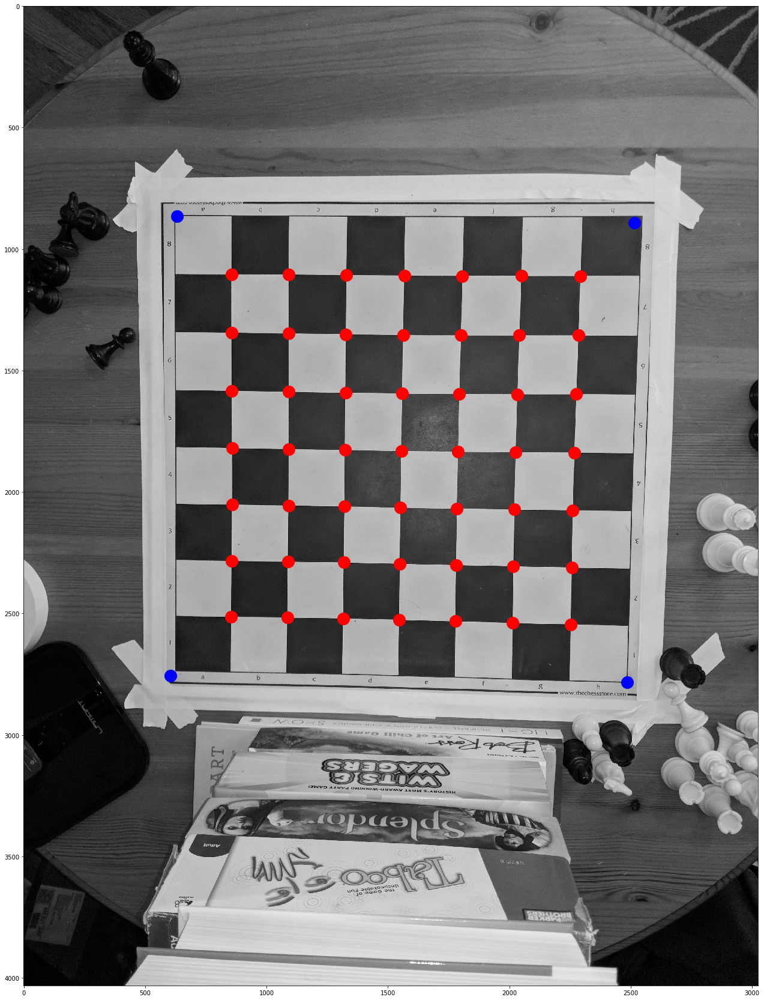

In [15]:
plt.figure(figsize=(30,30))
plt.imshow(img, cmap='gray')
for x in range(7):
    for y in range(7):
        plt.plot([corners2[x,y,0]],[corners2[x,y,1]],'o',color = 'r',markersize=20)
plt.plot([pts1[:,0]],[pts1[:,1]],'o',color ='b', markersize=20)

In [16]:
M =cv2.getPerspectiveTransform(pts1,pts2)
dst = cv2.warpPerspective(img,M,(1080,1080))

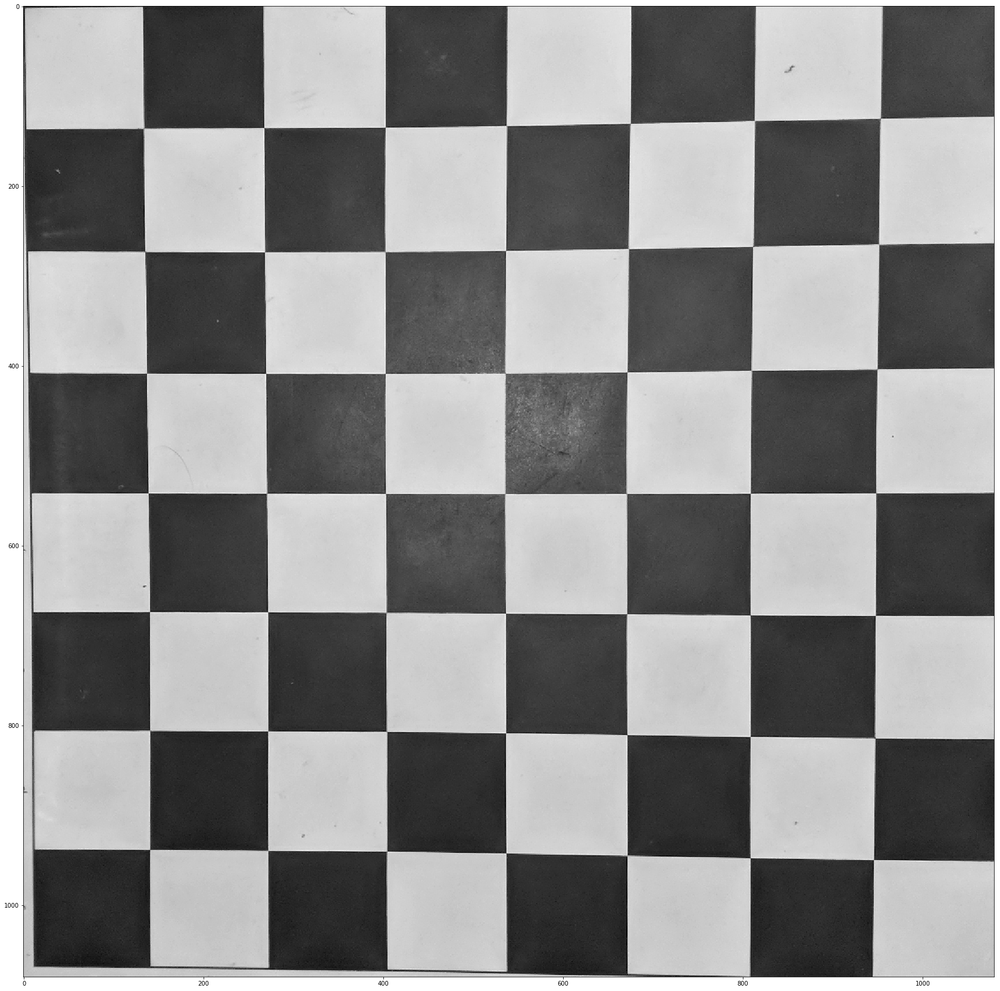

In [17]:
plt.figure(figsize=(30,30))
plt.imshow(dst, cmap='gray')


In [18]:
ret_dst, corners_dst = cv2.findChessboardCorners(dst,(7,7), None)
corners_dst = corners_dst.reshape((49,2))
corners2_dst = corners_dst.reshape((7,7,2))

In [19]:
X_Regressor_dst = LinearRegression()
Y_Regressor_dst = LinearRegression()

X_Regressor_dst.fit(X_train,corners_dst[:,0])
Y_Regressor_dst.fit(X_train,corners_dst[:,1])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [20]:
x_predict_dst = X_Regressor_dst.predict(edge_features)
y_predict_dst = Y_Regressor_dst.predict(edge_features)

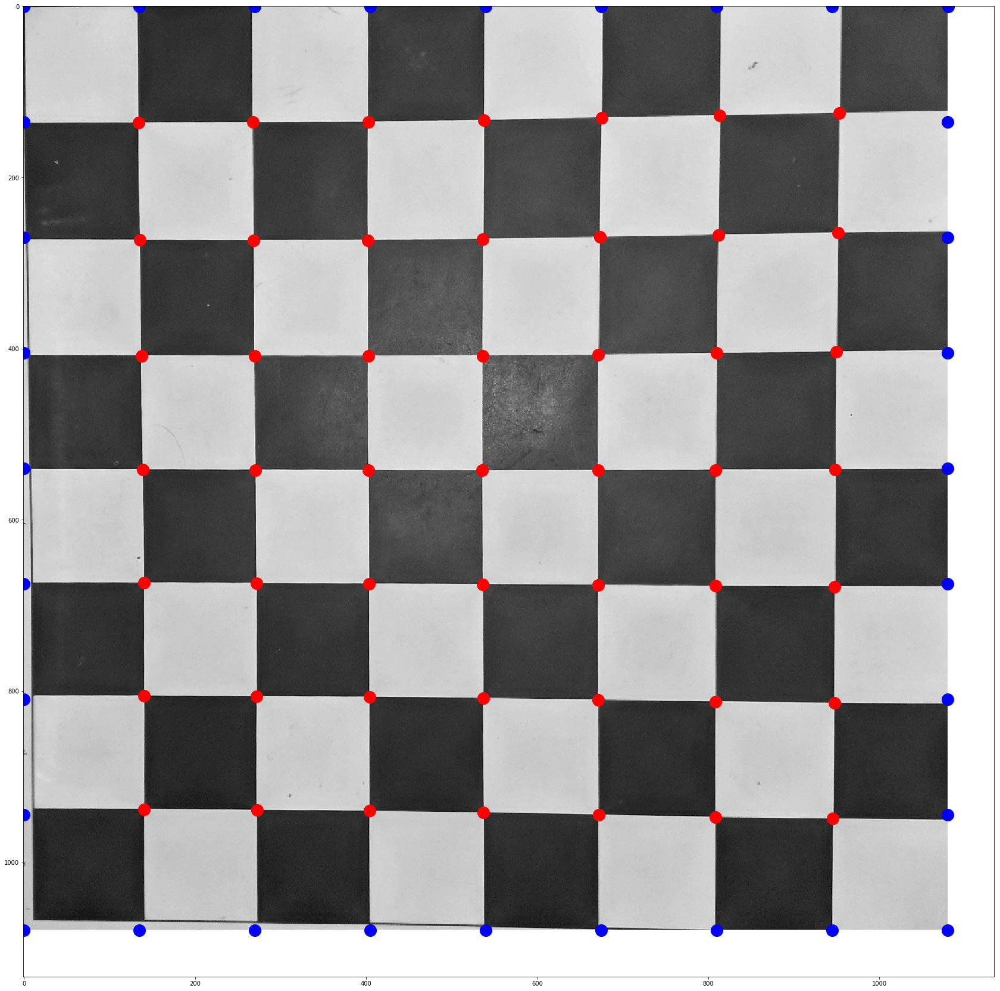

In [21]:
plt.figure(figsize=(30,30))
plt.imshow(dst, cmap='gray')
for x in range(7):
    for y in range(7):
        plt.plot([corners2_dst[x,y,0]],[corners2_dst[x,y,1]],'o',color = 'r',markersize=20)
plt.plot([x_predict_dst],[y_predict_dst],'o',color = 'b',markersize=20)

True

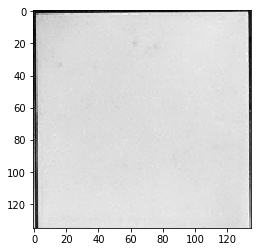

In [22]:
import math
a8 = dst[0:math.floor(1080/8),0:math.floor(1080/8)]
plt.imshow(dst[0:math.floor(1080/8),0:math.floor(1080/8)], cmap='gray')
cv2.imwrite("a8.jpg",a8)

In [23]:
M

array([[ 7.98975682e-03, -5.70990108e-01,  1.56925179e+03],
       [-5.73806708e-01, -8.58106305e-03,  1.45030099e+03],
       [ 6.80841486e-11,  1.91921142e-11,  1.00000000e+00]])

In [24]:
board_img = cv2.imread('../data/board_photos/set1/IMG_20181005_162518.jpg',0)
trans_board_img = cv2.warpPerspective(board_img,M,(1080,1080))

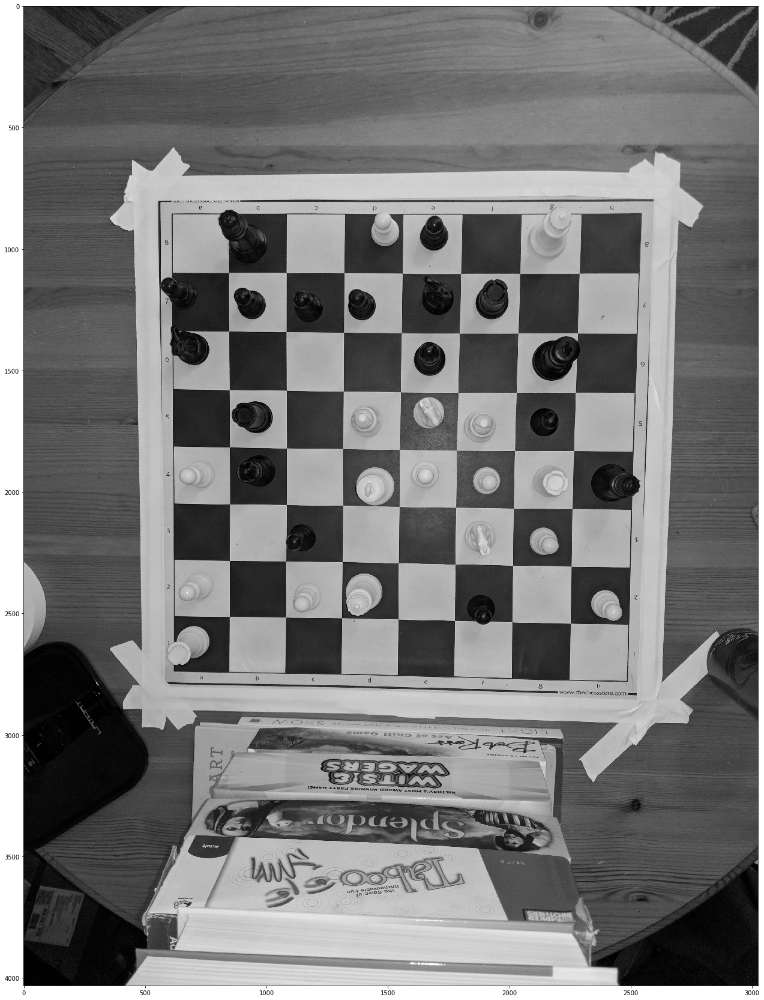

In [25]:
plt.figure(figsize=(30,30))
plt.imshow(board_img, cmap='gray')

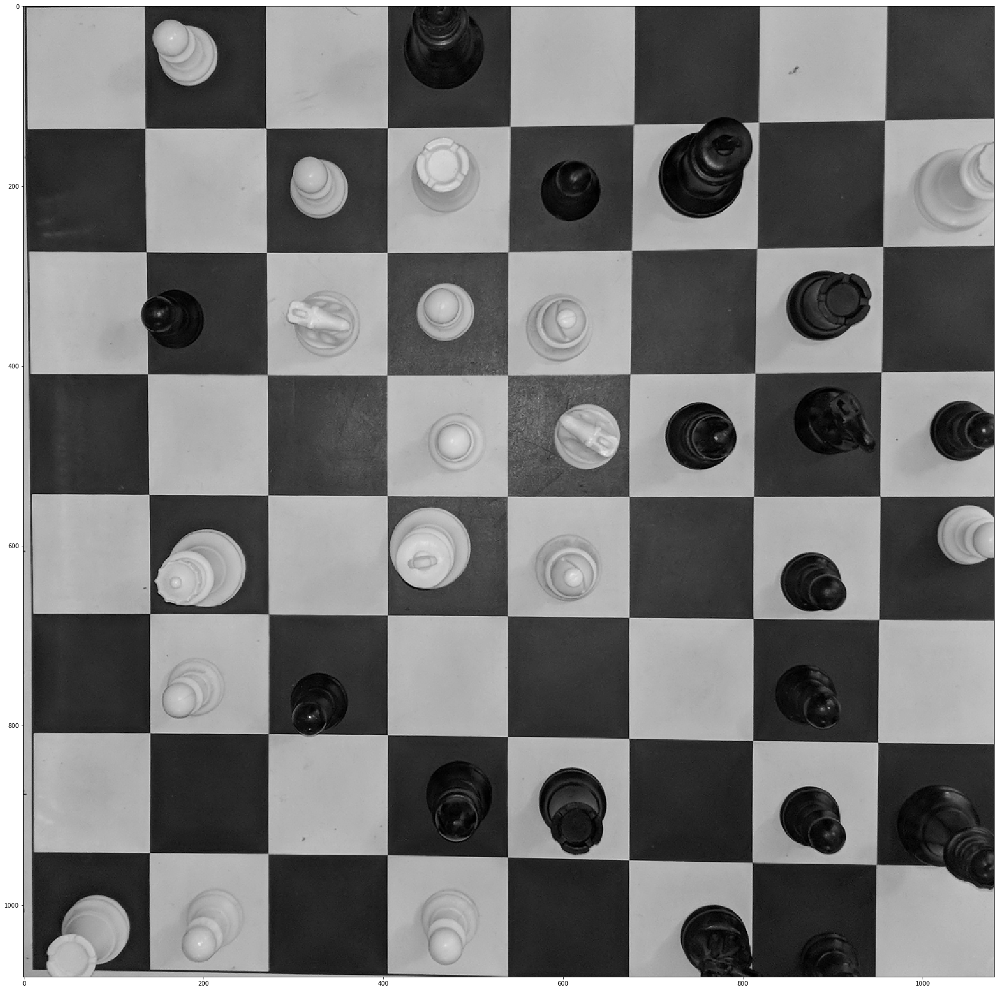

In [26]:
plt.figure(figsize=(30,30))
plt.imshow(trans_board_img, cmap='gray')